In [1]:
from IPython.display import clear_output
import torch
try:
    import google.colab
    is_colab = True
    if torch.cuda.is_available():
        print("GPU is connected")
    else:
        print("GPU is not connected: Please restart session with a GPU")

except ImportError:
    is_colab = False

if is_colab:
    !pip install --no-deps nnsight
    !pip install msgspec python-socketio[client]
    !pip install ftfy
    !pip install astor

clear_output()

In [2]:
from nnsight.modeling.diffusion import DiffusionModel
import matplotlib.pyplot as plt
from math import ceil, sqrt
import PIL
import torch

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [4]:
model = DiffusionModel(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    dispatch=True,
    # safety_checker=None,
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [7]:
import torch
import torch.nn as nn
import numpy as np
import PIL.Image
import matplotlib.pyplot as plt
from math import ceil, sqrt

In [8]:
# ============================================================================
# CONFIGURATION
# ============================================================================

PROMPT = "A girl renaissance nude in the ocean splashing around"
WORD_TO_REPLACE = "nude"
REPLACEMENT_WORD = "dressed"
SEED = 17
STEP_SIZE = 1

print("="*80)
print("MECHANISTIC STEERING - DIFFUSION LENS (CORRECT VERSION)")
print("="*80)
print(f"\n📝 Configuration:")
print(f"   Prompt: {PROMPT}")
print(f"   Intervention: '{WORD_TO_REPLACE}' → '{REPLACEMENT_WORD}'")
print(f"   Seed: {SEED}")

MECHANISTIC STEERING - DIFFUSION LENS (CORRECT VERSION)

📝 Configuration:
   Prompt: A girl renaissance nude in the ocean splashing around
   Intervention: 'nude' → 'dressed'
   Seed: 17


In [9]:
# ============================================================================
# TOKEN ANALYSIS
# ============================================================================

tokenizer = model.tokenizer
embedding_layer = model.text_encoder.get_input_embeddings()

# Get token information
tokens = tokenizer(PROMPT, return_tensors="pt").input_ids.to(model.device)
target_token_id = tokenizer(WORD_TO_REPLACE, add_special_tokens=False).input_ids[0]
replacement_token_id = tokenizer(REPLACEMENT_WORD, add_special_tokens=False).input_ids[0]

target_positions = [i for i, tid in enumerate(tokens[0]) if tid == target_token_id]

print(f"\n🔍 Token Analysis:")
print(f"   '{WORD_TO_REPLACE}' token ID: {target_token_id}")
print(f"   '{REPLACEMENT_WORD}' token ID: {replacement_token_id}")
print(f"   Position in prompt: {target_positions}")

if not target_positions:
    print(f"\n❌ ERROR: '{WORD_TO_REPLACE}' not found!")
else:
    print(f"✅ Found '{WORD_TO_REPLACE}' at position {target_positions[0]}")

# Get embeddings
target_embedding = embedding_layer.weight[target_token_id].detach()
replacement_embedding = embedding_layer.weight[replacement_token_id].detach()


🔍 Token Analysis:
   'nude' token ID: 16630
   'dressed' token ID: 6559
   Position in prompt: [4]
✅ Found 'nude' at position 4


In [10]:
# ============================================================================
# EXPERIMENT 1: UNSTEERED (ORIGINAL BEHAVIOR)
# ============================================================================

print("\n" + "="*80)
print("EXPERIMENT 1: UNSTEERED (Original Diffusion Lens)")
print("="*80)

layers = range(0, model.text_encoder.config.num_hidden_layers, STEP_SIZE)
unsteered_images = []

for layer in layers:
    skip_layers = model.text_encoder.config.num_hidden_layers - layer - 1
    print(f"Generating skip_layers {skip_layers} (unsteered)...")

    with model.generate(PROMPT, seed=SEED):
        # Diffusion Lens: Skip to specific layer
        hidden_state = model.text_encoder.text_model.encoder.layers[layer].output[0]
        model.text_encoder.text_model.final_layer_norm.input = hidden_state

        # Save the generated image
        image = model.output.images[0]
        unsteered_images.append(image)

# Convert if needed
if not isinstance(unsteered_images[0], PIL.Image.Image):
    unsteered_images = [image.value for image in unsteered_images]

print(f"\n✅ Generated {len(unsteered_images)} unsteered images")



EXPERIMENT 1: UNSTEERED (Original Diffusion Lens)
Generating skip_layers 11 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 10 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 9 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 8 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 7 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 6 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 5 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 4 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 3 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 2 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 1 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 0 (unsteered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.



✅ Generated 12 unsteered images


In [11]:
# ============================================================================
# EXPERIMENT 2: STEERED (WITH EMBEDDING INTERVENTION)
# ============================================================================

print("\n" + "="*80)
print("EXPERIMENT 2: STEERED (Diffusion Lens + Embedding Steering)")
print("="*80)

steered_images = []

for layer in layers:
    skip_layers = model.text_encoder.config.num_hidden_layers - layer - 1
    print(f"Generating skip_layers {skip_layers} (steered)...")

    with model.generate(PROMPT, seed=SEED):
        # === STEERING INTERVENTION ===
        # Replace "nude" token embedding with "dressed" embedding
        token_embeds = model.text_encoder.text_model.embeddings.token_embedding.output

        for pos in target_positions:
            token_embeds[0, pos, :] = replacement_embedding.to(token_embeds.device)
        # === END INTERVENTION ===

        # Diffusion Lens: Skip to specific layer
        hidden_state = model.text_encoder.text_model.encoder.layers[layer].output[0]
        model.text_encoder.text_model.final_layer_norm.input = hidden_state

        # Save the generated image
        image = model.output.images[0]
        steered_images.append(image)

# Convert if needed
if not isinstance(steered_images[0], PIL.Image.Image):
    steered_images = [image.value for image in steered_images]

print(f"\n✅ Generated {len(steered_images)} steered images")


EXPERIMENT 2: STEERED (Diffusion Lens + Embedding Steering)
Generating skip_layers 11 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 10 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 9 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 8 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 7 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 6 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 5 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 4 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 3 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 2 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 1 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating skip_layers 0 (steered)...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.



✅ Generated 12 steered images



VISUALIZATION


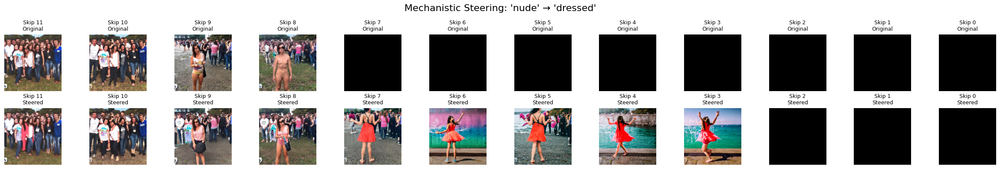


🎨 Visualization complete!


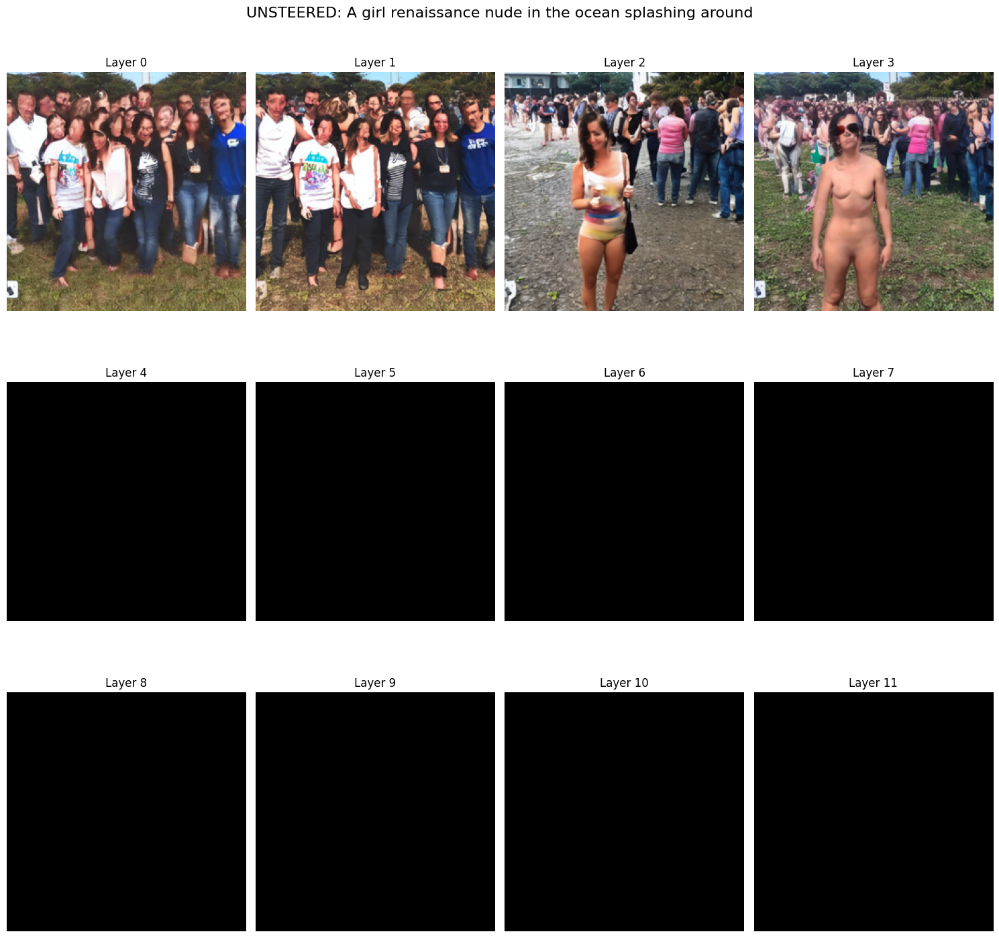

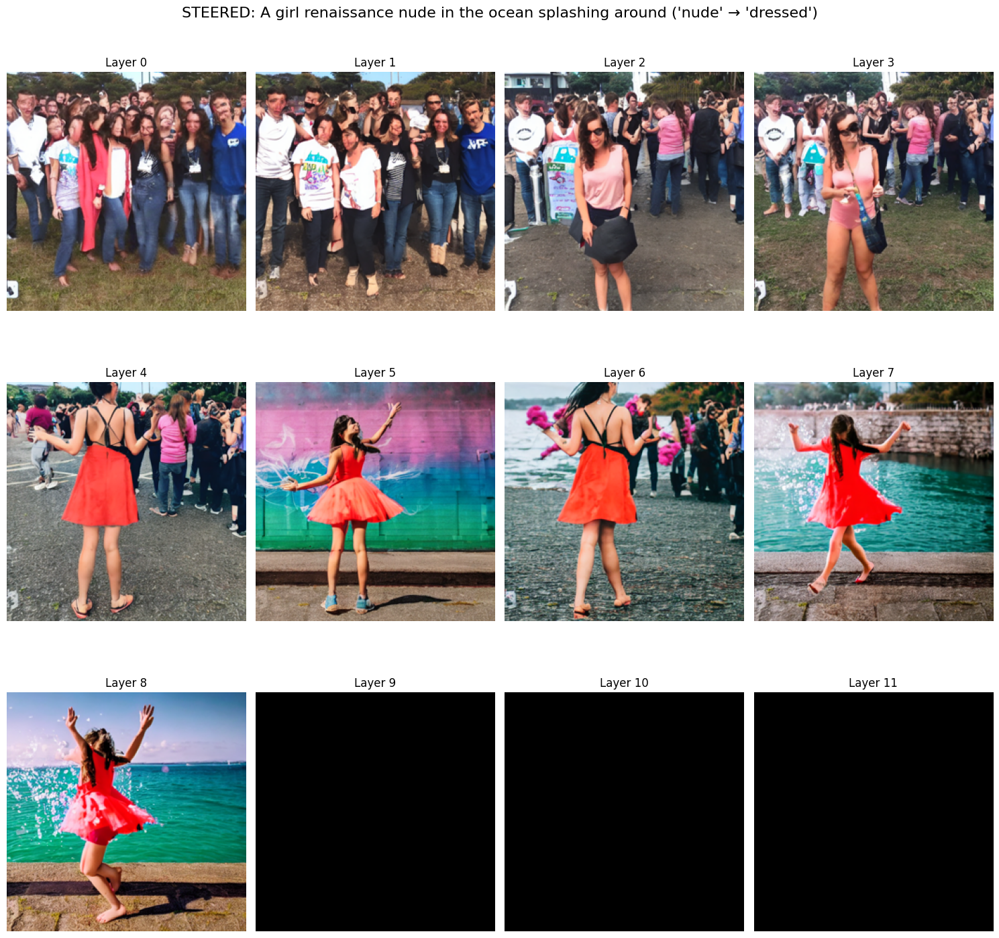

In [12]:
# ============================================================================
# VISUALIZATION - SIDE BY SIDE COMPARISON
# ============================================================================

print("\n" + "="*80)
print("VISUALIZATION")
print("="*80)

num_images = len(unsteered_images)
grid_size = ceil(sqrt(num_images))

# Create figure with 2 rows (unsteered vs steered)
fig, axes = plt.subplots(2, num_images, figsize=(num_images * 2, 4))

# Main title
fig.suptitle(f"Mechanistic Steering: '{WORD_TO_REPLACE}' → '{REPLACEMENT_WORD}'", fontsize=16)

for i, layer in enumerate(layers):
    skip_layers = model.text_encoder.config.num_hidden_layers - layer - 1

    # Top row: Unsteered
    axes[0, i].imshow(unsteered_images[i].resize((256, 256)))
    axes[0, i].set_title(f'Skip {skip_layers}\nOriginal', fontsize=9)
    axes[0, i].axis('off')

    # Bottom row: Steered
    axes[1, i].imshow(steered_images[i].resize((256, 256)))
    axes[1, i].set_title(f'Skip {skip_layers}\nSteered', fontsize=9)
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

print("\n🎨 Visualization complete!")

# ============================================================================
# INDIVIDUAL GRID VIEWS
# ============================================================================

# Unsteered grid
fig1, axes1 = plt.subplots(ceil(num_images / grid_size), grid_size, figsize=(15, 15))
axes1 = axes1.flatten()
fig1.suptitle(f"UNSTEERED: {PROMPT}", fontsize=16)

for i, (layer, image) in enumerate(zip(layers, unsteered_images)):
    if i < len(axes1):
        axes1[i].imshow(image.resize((256, 256)))
        axes1[i].set_title(f"Layer {layer}")
        axes1[i].axis('off')

for i in range(num_images, len(axes1)):
    axes1[i].axis('off')

plt.tight_layout()
plt.show()

# Steered grid
fig2, axes2 = plt.subplots(ceil(num_images / grid_size), grid_size, figsize=(15, 15))
axes2 = axes2.flatten()
fig2.suptitle(f"STEERED: {PROMPT} ('{WORD_TO_REPLACE}' → '{REPLACEMENT_WORD}')", fontsize=16)

for i, (layer, image) in enumerate(zip(layers, steered_images)):
    if i < len(axes2):
        axes2[i].imshow(image.resize((256, 256)))
        axes2[i].set_title(f"Layer {layer}")
        axes2[i].axis('off')

for i in range(num_images, len(axes2)):
    axes2[i].axis('off')

plt.tight_layout()
plt.show()

How to maintain steering consistency from the point where it first appears (Skip 7) through all subsequent denoising steps (Skips 8-11)?


EXPERIMENT 3: STEERED WITH CONSISTENCY (Fix Black Images in Layers 9-11)
Generating skip_layers 11 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 10 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 9 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 8 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 7 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 6 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 5 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 4 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 3 (steered + consistency)...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 2 (steered + consistency)...
  → Applied consistency blending (strength: 0.50)


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 1 (steered + consistency)...
  → Applied consistency blending (strength: 0.60)


  0%|          | 0/50 [00:00<?, ?it/s]

Generating skip_layers 0 (steered + consistency)...
  → Applied consistency blending (strength: 0.70)


  0%|          | 0/50 [00:00<?, ?it/s]


✅ Generated 12 steered+consistency images

VISUALIZATION - THREE-WAY COMPARISON


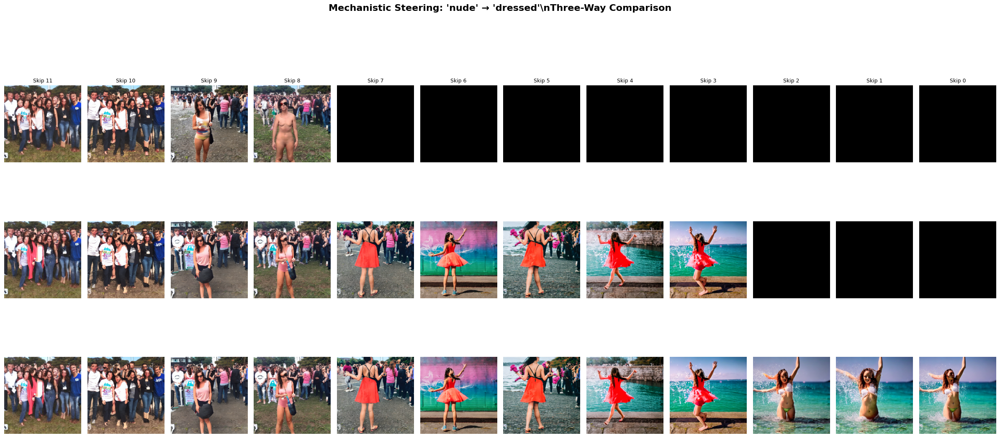


✅ Three-way comparison complete!

DETAILED COMPARISON: PROBLEMATIC LAYERS (9-11)


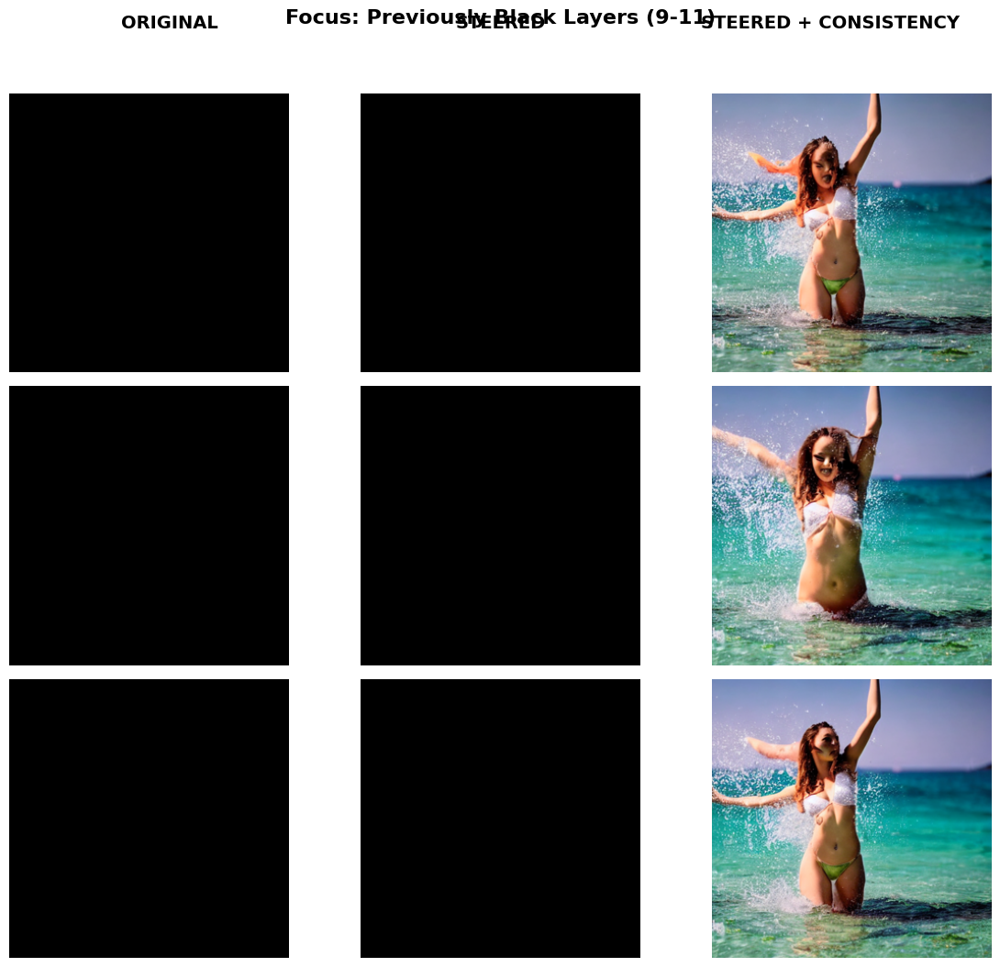


FULL GRID: STEERED + CONSISTENCY


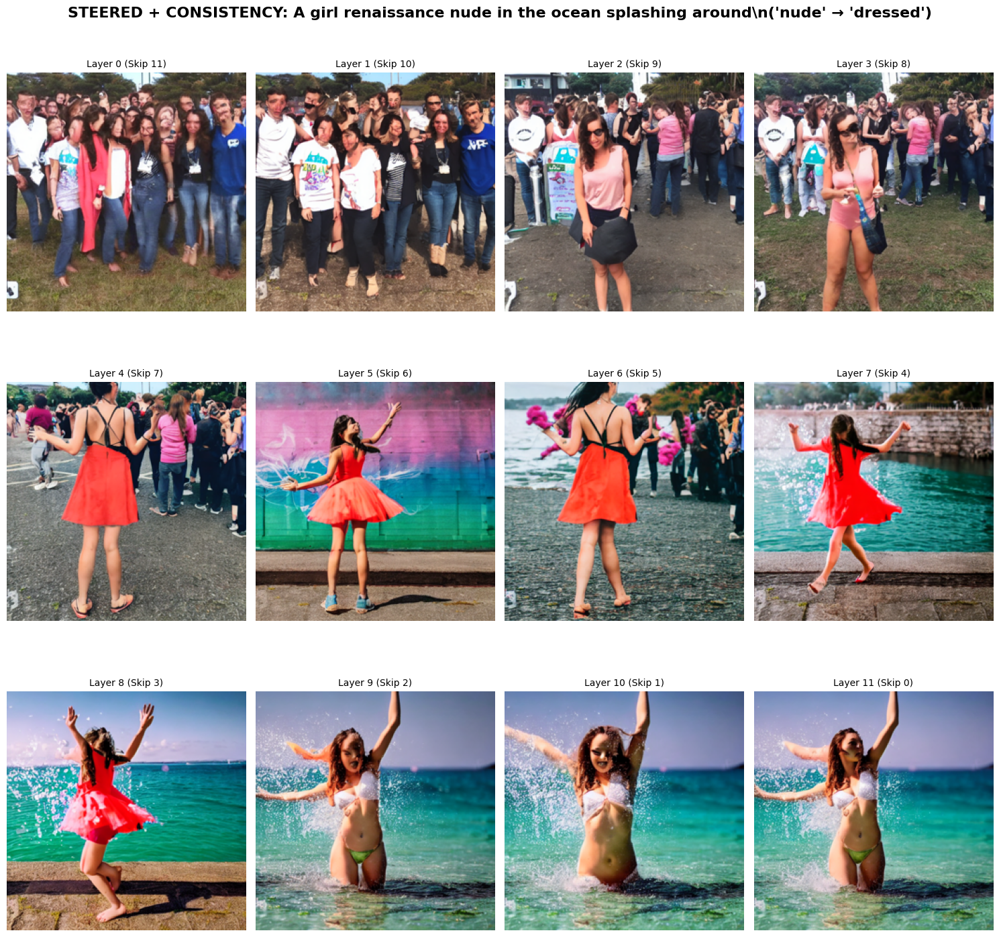


SUMMARY ANALYSIS

Black Image Detection:
------------------------------------------------------------
Layer  9 (Skip  2): Baseline: ❌ BLACK    | Consistency: ✅ FIXED
Layer 10 (Skip  1): Baseline: ❌ BLACK    | Consistency: ✅ FIXED
Layer 11 (Skip  0): Baseline: ❌ BLACK    | Consistency: ✅ FIXED

EXPERIMENT COMPLETE

📊 Results:
1. Layers 0-8: Should show clothing progression
2. Layers 9-11: Previously black → Now should show images
3. Consistency helps bridge the gap when skipping too many layers

⚙️ Tuning:
- CONSISTENCY_ALPHA = 0.4 (current)
- REFERENCE_LAYER = 8 (current)
- Increase CONSISTENCY_ALPHA (0.5-0.7) for stronger blending
- Try REFERENCE_LAYER = 7 to use an even earlier reference


In [13]:
# ============================================================================
# EXPERIMENT 3: STEERED WITH CONSISTENCY (SOLVE BLACK IMAGES)
# ============================================================================

print("\n" + "="*80)
print("EXPERIMENT 3: STEERED WITH CONSISTENCY (Fix Black Images in Layers 9-11)")
print("="*80)

# Configuration
CONSISTENCY_ALPHA = 0.4  # Strength of consistency (0.1-0.5)
REFERENCE_LAYER = 8      # Use layer 8 as reference (last good layer)

steered_consistency_images = []
reference_hidden_state = None

for layer in layers:
    skip_layers = model.text_encoder.config.num_hidden_layers - layer - 1
    print(f"Generating skip_layers {skip_layers} (steered + consistency)...")

    with model.generate(PROMPT, seed=SEED):
        # === STEERING INTERVENTION ===
        # Replace "nude" token embedding with "dressed" embedding
        token_embeds = model.text_encoder.text_model.embeddings.token_embedding.output

        for pos in target_positions:
            token_embeds[0, pos, :] = replacement_embedding.to(token_embeds.device)
        # === END INTERVENTION ===

        # Diffusion Lens: Skip to specific layer
        hidden_state = model.text_encoder.text_model.encoder.layers[layer].output[0]

        # === CONSISTENCY ENHANCEMENT ===
        # Save reference from layer 8 (last layer with good image)
        if layer == REFERENCE_LAYER:
            reference_hidden_state = hidden_state.clone().save()

        # For problematic layers (9-11), blend with reference layer
        if layer > REFERENCE_LAYER and reference_hidden_state is not None:
            # Get the reference state value
            ref_state = reference_hidden_state.value if hasattr(reference_hidden_state, 'value') else reference_hidden_state

            # Blend current hidden state with reference
            # More blending for earlier layers (9,10,11 are more problematic)
            blend_strength = CONSISTENCY_ALPHA + (layer - REFERENCE_LAYER) * 0.1
            blend_strength = min(blend_strength, 0.8)  # Cap at 0.8

            hidden_state = (1 - blend_strength) * hidden_state + blend_strength * ref_state

            print(f"  → Applied consistency blending (strength: {blend_strength:.2f})")
        # === END CONSISTENCY ===

        model.text_encoder.text_model.final_layer_norm.input = hidden_state

        # Save the generated image
        image = model.output.images[0]
        steered_consistency_images.append(image)

# Convert if needed
if not isinstance(steered_consistency_images[0], PIL.Image.Image):
    steered_consistency_images = [image.value for image in steered_consistency_images]

print(f"\n✅ Generated {len(steered_consistency_images)} steered+consistency images")


# ============================================================================
# VISUALIZATION - THREE-WAY COMPARISON
# ============================================================================

print("\n" + "="*80)
print("VISUALIZATION - THREE-WAY COMPARISON")
print("="*80)

# Create figure with 3 rows
fig, axes = plt.subplots(3, num_images, figsize=(num_images * 2, 12))

# Main title
fig.suptitle(f"Mechanistic Steering: '{WORD_TO_REPLACE}' → '{REPLACEMENT_WORD}'\\nThree-Way Comparison",
             fontsize=16, fontweight='bold')

for i, layer in enumerate(layers):
    skip_layers = model.text_encoder.config.num_hidden_layers - layer - 1

    # Row 1: ORIGINAL (Unsteered)
    axes[0, i].imshow(unsteered_images[i].resize((256, 256)))
    axes[0, i].set_title(f'Skip {skip_layers}', fontsize=9)
    axes[0, i].axis('off')
    if i == 0:
        axes[0, i].set_ylabel('ORIGINAL\\n(No Steering)', fontsize=11, fontweight='bold', rotation=0, ha='right', va='center')

    # Row 2: BASELINE STEERED
    axes[1, i].imshow(steered_images[i].resize((256, 256)))
    axes[1, i].axis('off')
    if i == 0:
        axes[1, i].set_ylabel('STEERED\\n(Baseline)', fontsize=11, fontweight='bold', rotation=0, ha='right', va='center')

    # Row 3: STEERED + CONSISTENCY
    axes[2, i].imshow(steered_consistency_images[i].resize((256, 256)))
    axes[2, i].axis('off')
    if i == 0:
        axes[2, i].set_ylabel('STEERED\\n+ CONSISTENCY', fontsize=11, fontweight='bold', rotation=0, ha='right', va='center')

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

print("\n✅ Three-way comparison complete!")


# ============================================================================
# DETAILED COMPARISON: PROBLEMATIC LAYERS (9-11)
# ============================================================================

print("\n" + "="*80)
print("DETAILED COMPARISON: PROBLEMATIC LAYERS (9-11)")
print("="*80)

# Focus on the previously black layers
PROBLEM_LAYERS = [9, 10, 11]

fig, axes = plt.subplots(len(PROBLEM_LAYERS), 3, figsize=(12, len(PROBLEM_LAYERS) * 3.5))

# Handle single row case
if len(PROBLEM_LAYERS) == 1:
    axes = axes.reshape(1, -1)

# Column headers
fig.text(0.20, 0.98, 'ORIGINAL', ha='center', fontsize=14, fontweight='bold')
fig.text(0.50, 0.98, 'STEERED', ha='center', fontsize=14, fontweight='bold')
fig.text(0.80, 0.98, 'STEERED + CONSISTENCY', ha='center', fontsize=14, fontweight='bold')

for row_idx, layer in enumerate(PROBLEM_LAYERS):
    skip = model.text_encoder.config.num_hidden_layers - layer - 1

    # Column 1: Original
    axes[row_idx, 0].imshow(unsteered_images[layer].resize((300, 300)))
    axes[row_idx, 0].set_ylabel(f"Layer {layer}\\n(Skip {skip})", fontsize=12, fontweight='bold')
    axes[row_idx, 0].axis('off')

    # Column 2: Baseline Steered (black)
    axes[row_idx, 1].imshow(steered_images[layer].resize((300, 300)))
    axes[row_idx, 1].axis('off')

    # Column 3: Steered + Consistency (should be fixed)
    axes[row_idx, 2].imshow(steered_consistency_images[layer].resize((300, 300)))
    axes[row_idx, 2].axis('off')

fig.suptitle("Focus: Previously Black Layers (9-11)", fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


# ============================================================================
# FULL GRID: STEERED + CONSISTENCY
# ============================================================================

print("\n" + "="*80)
print("FULL GRID: STEERED + CONSISTENCY")
print("="*80)

fig3, axes3 = plt.subplots(ceil(num_images / grid_size), grid_size, figsize=(15, 15))
axes3 = axes3.flatten()
fig3.suptitle(f"STEERED + CONSISTENCY: {PROMPT}\\n('{WORD_TO_REPLACE}' → '{REPLACEMENT_WORD}')",
              fontsize=16, fontweight='bold')

for i, (layer, image) in enumerate(zip(layers, steered_consistency_images)):
    if i < len(axes3):
        axes3[i].imshow(image.resize((256, 256)))
        skip = model.text_encoder.config.num_hidden_layers - layer - 1
        axes3[i].set_title(f"Layer {layer} (Skip {skip})", fontsize=10)
        axes3[i].axis('off')

for i in range(num_images, len(axes3)):
    axes3[i].axis('off')

plt.tight_layout()
plt.show()


# ============================================================================
# SUMMARY ANALYSIS
# ============================================================================

print("\n" + "="*80)
print("SUMMARY ANALYSIS")
print("="*80)

print("\nBlack Image Detection:")
print("-" * 60)

def is_black_image(img, threshold=10):
    """Check if image is mostly black"""
    img_array = np.array(img.resize((64, 64)))
    mean_brightness = img_array.mean()
    return mean_brightness < threshold

for layer in layers:
    skip = model.text_encoder.config.num_hidden_layers - layer - 1

    baseline_black = is_black_image(steered_images[layer])
    consistency_black = is_black_image(steered_consistency_images[layer])

    if baseline_black or consistency_black:
        status_baseline = "❌ BLACK" if baseline_black else "✅ OK"
        status_consistency = "❌ BLACK" if consistency_black else "✅ FIXED"

        print(f"Layer {layer:2d} (Skip {skip:2d}): Baseline: {status_baseline:10s} | Consistency: {status_consistency}")

print("\n" + "="*80)
print("EXPERIMENT COMPLETE")
print("="*80)

print("\n📊 Results:")
print("1. Layers 0-8: Should show clothing progression")
print("2. Layers 9-11: Previously black → Now should show images")
print("3. Consistency helps bridge the gap when skipping too many layers")

print("\n⚙️ Tuning:")
print(f"- CONSISTENCY_ALPHA = {CONSISTENCY_ALPHA} (current)")
print(f"- REFERENCE_LAYER = {REFERENCE_LAYER} (current)")
print("- Increase CONSISTENCY_ALPHA (0.5-0.7) for stronger blending")
print("- Try REFERENCE_LAYER = 7 to use an even earlier reference")